**Цели исследования:**

Исследование рынка Москвы, поиск интересных особенности и презентация полученнх результатов

**Задачи исследования:**

<a name=""></a>
# Шаг №1. Загрузите данные и подготовьте их к анализу

- Загрузите данные о заведениях общественного питания Москвы.
- Путь к файлу: /datasets/moscow_places.csv

<a name=""></a>
# Шаг 2. Выполните предобработку данных

1. Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
2. Выполните предобработку данных:
- Создайте столбец street с названиями улиц из столбца с адресом.
- Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  - логическое значение True — если заведение работает ежедневно и круглосуточно;
  - логическое значение False — в противоположном случае.

<a name=""></a>
# Шаг 3. Анализ данных

- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.
- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.
- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.
- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.
- Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района.  
- Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. 
- Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
- Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.
- Соберите наблюдения по вопросам выше в один общий вывод.

<a name=""></a>
# Шаг 4. Детализируем исследование: открытие кофейни

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

<a name="stage_5"></a>
# Шаг 5. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчико

**Оглавление**
1. [Шаг 1. Загрузите данные и изучите общую информацию](#stage_1)
2. [Шаг 2. Выполните предобработку данных](#stage_2)
3. [Шаг 3. Анализ данных](#stage_3)
4. [Шаг 4. Детализируем исследование: открытие кофейни](#stage_4)
5. [Шаг 5. Подготовка презентации](#stage_5)

<a name="stage_1"></a>
# Шаг 1. Загрузите данные и изучите общую информацию

In [1]:
#В первую очередь, необходимо импортировать все необходимые библиотеки:
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
sns.set(rc={'figure.figsize':(15, 12)})
import requests

import scipy.stats as stats
from scipy import stats as st
from pandas.io.json import json_normalize
from pprint import pprint

import json

import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

import math
import numpy as np

In [2]:
#теперь откроем и прчоитаем файл:
df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [3]:
#посмотрим на табилцу в разрезе какие типы данных в каждой колнке и пр.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


<a name="stage_2"></a>
# Шаг 2. Выполните предобработку данных

**Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?**

In [4]:
#посмотрим на пропуски
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [5]:
#првоерим дубликаты
df.duplicated().sum()

0

In [6]:
df['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Орма                  1
Ла Специя             1
Garret                1
Park50                1
Surf'n'Fries          1
Name: name, Length: 5614, dtype: int64

In [7]:
df['address'].value_counts()

Москва, проспект Вернадского, 86В        28
Москва, Усачёва улица, 26                26
Москва, Ярцевская улица, 19              20
Москва, площадь Киевского Вокзала, 2     20
Москва, Лесная улица, 20, стр. 3         16
                                         ..
Москва, Шоссейная улица, 90, стр. 5       1
Москва, проспект Вернадского, вл41        1
Москва, улица Земляной Вал, 54с1          1
Москва, Алтуфьевское шоссе, 52            1
Москва, улица Красная Пресня, 32-34с3     1
Name: address, Length: 5753, dtype: int64

In [8]:
df['address'].unique().tolist()

['Москва, улица Дыбенко, 7/1',
 'Москва, улица Дыбенко, 36, корп. 1',
 'Москва, Клязьминская улица, 15',
 'Москва, улица Маршала Федоренко, 12',
 'Москва, Правобережная улица, 1Б',
 'Москва, Ижорская улица, вл8Б',
 'Москва, Клязьминская улица, 9, стр. 3',
 'Москва, Дмитровское шоссе, 107, корп. 4',
 'Москва, Ангарская улица, 39',
 'Москва, Левобережная улица, 12',
 'Москва, улица Маршала Федоренко, 10с1',
 'Москва, МКАД, 80-й километр, 1',
 'Москва, Базовская улица, 15, корп. 1',
 'Москва, Ангарская улица, 42с1',
 'Москва, улица Бусиновская Горка, 2',
 'Москва, Базовская улица, 15, корп. 8',
 'Москва, Ленинградское шоссе, 71Б, стр. 2',
 'Москва, Коровинское шоссе, 30А',
 'Москва, Ижорский проезд, 5',
 'Москва, Прибрежный проезд, 7',
 'Москва, Коровинское шоссе, 35, стр. 17',
 'Москва, Лобненская улица, 13к2',
 'Москва, улица Дыбенко, 9Ас1',
 'Москва, парк Левобережный',
 'Москва, Дмитровское шоссе, 107к2',
 'Москва, улица Дыбенко, 7, стр. 1',
 'Москва, МКАД, 78-й километр, 14к1',
 'Мос

In [9]:
df['name'].unique().tolist()

['WoWфли',
 'Четыре комнаты',
 'Хазри',
 'Dormouse Coffee Shop',
 'Иль Марко',
 'Sergio Pizza',
 'Огни города',
 'Mr. Уголёк',
 'Donna Maria',
 'Готика',
 'Great Room Bar',
 'Шашлык Шефф',
 'Заправка',
 'Буханка',
 'У Сильвы',
 'Дом обеда',
 'База Стритфуд',
 'Чайхана Беш-Бармак',
 'Час-Пик',
 'Пекарня',
 'Чебуреки Манты',
 '7/12',
 'Крымские чебуреки',
 'Drive Café',
 'В парке вкуснее',
 'Пикочино',
 'Шаурму Х@чу',
 'Mafe',
 'Кушай Город',
 'Кафедра',
 'Алталия',
 'Додо Пицца',
 'Изба',
 "Домино'с Пицца",
 'Виладж пицца',
 'Пекарня № 1 Грузинская кухня',
 'Халяль закусочная',
 'Ижора',
 'Шаурмагия',
 'Кафе',
 'Крошка Картошка',
 'Варня кафе',
 'Суши & пицца',
 'Кафетерий',
 '9 Bar Coffee',
 'CofeFest',
 'БлинБери',
 '2U-Ту-Ю',
 'Шаурма',
 'Арамье',
 'Cofix',
 'Royal Coffee',
 'Шашлык',
 'Чебуреки и манты',
 'Рыба из тандыра',
 'Мир пиццы',
 "Coffeekaldi's",
 'Хинкали Gали!',
 'Чебуречная история',
 'Кафе Лоза',
 'Пить Есть!',
 'Pizza Hut',
 'Testo мания',
 'Альбатрос',
 'Молинари',
 '

Дубликатов не найдено. есть пропуски в некоторых колонках. Т.к. пропусков приличное количество, кудалять их не буду. есть риск исказить итоговые результаты. Заменить пропуски какими либо коректными данными тоже не представляется возможным.

**Выполняем предобработку данных:**

- Создайте столбец 'street' с названиями улиц из столбца с адресом.

In [10]:
df['street'] = [x.split(',')[1] for x in df['address'].values]
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


- Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [11]:
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


<a name="stage_3"></a>
# Шаг 3. Анализ данных

**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.**

In [12]:
#посмотрим сколько всего заведений по категориям есть в датасете:
df.groupby('category')['name'].count().sort_values().reset_index()

,category,name
0,булочная,256
1,столовая,315
2,быстрое питание,603
3,пиццерия,633
4,"бар,паб",765
5,кофейня,1413
6,ресторан,2043
7,кафе,2378


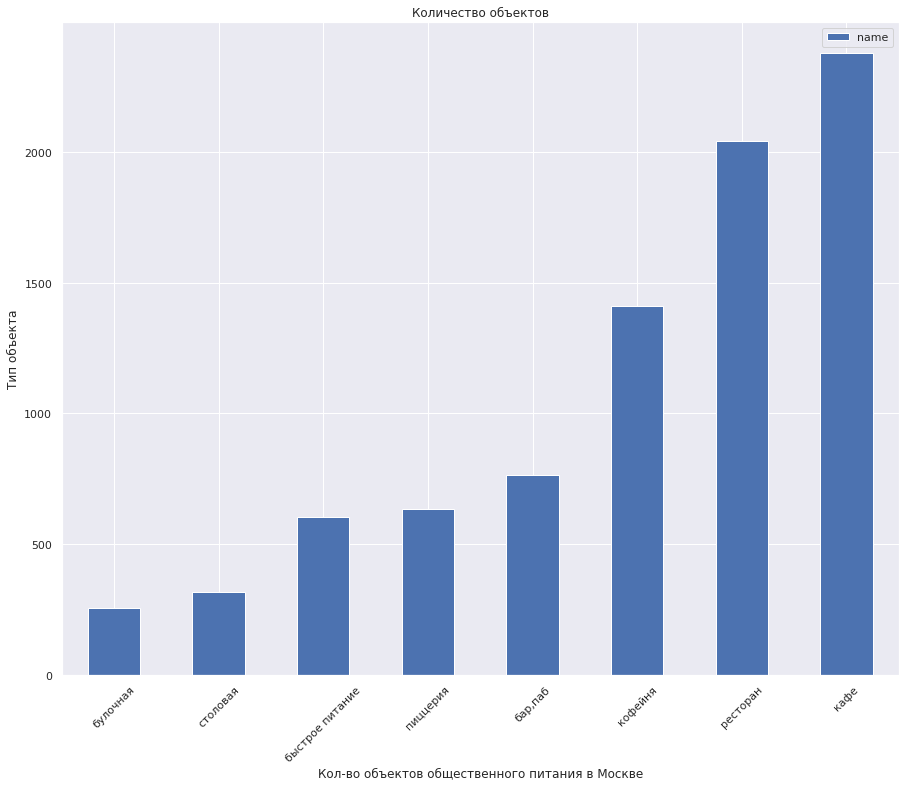

In [13]:
# и построим график отображающий таблицу выше
temp = df.groupby('category').count().reset_index()
ax = temp[['category', 'name']].set_index('category').sort_values('name', ascending=True).plot(kind='bar')
ax.set_xlabel('Кол-во объектов общественного питания в Москве')
ax.set_ylabel('Тип объекта')
ax.set_title('Количество объектов')
plt.xticks(rotation=45)
plt.show()

Больше всего заведений в категории "Кафе" - 2378 заведений. Меньше всего заведений в категории "булочная" - 256.

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**

In [14]:
temp[['category', 'seats']].sort_values(by='seats').rename(columns={'seats': 'total_seats'})

,category,total_seats
1,булочная,148
7,столовая,164
2,быстрое питание,349
5,пиццерия,427
0,"бар,паб",468
4,кофейня,751
3,кафе,1218
6,ресторан,1270


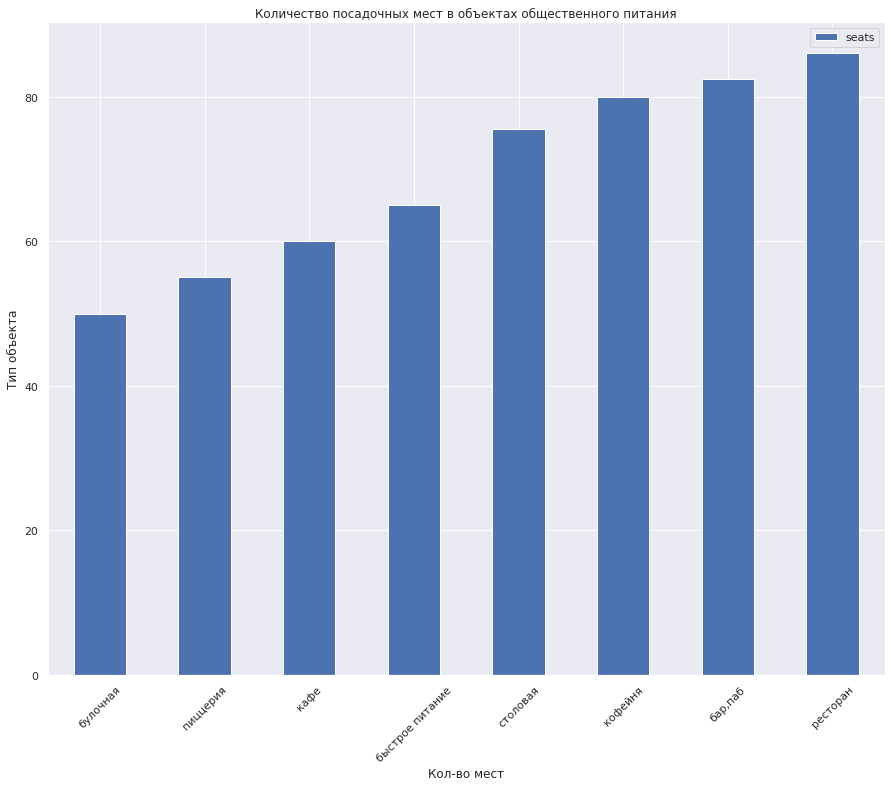

In [15]:
temp = df.groupby('category').median().reset_index()
ax = temp[['category', 'seats']].set_index('category').sort_values('seats', ascending=True).plot(kind='bar')
ax.set_xlabel('Кол-во мест')
ax.set_ylabel('Тип объекта')
ax.set_title('Количество посадочных мест в объектах общественного питания')
plt.xticks(rotation=45)
plt.show()

В ресторанах больше всего посадочных мест - 1270. А в "булочных" меньше всего - 148. Распределение не удивляет, поскольку формат "ресторана", "кафе" и "кофейни" предполагает что посетитель приходит не просто поесть, но и провести встречу и т.п. в общем не прсото поел и ушёл, а такие форматы как "булочная" - предполагает что еда будет братсья на вынос, с собою. 
Малое колчиество посадочных мест в столовой, быстрмо питании и пицерии также можно отнести к тому. что  там расчёт на то что люди быстро поедят и покинут заведение.

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [16]:
def chain_name(row):
    try:
        if row == True:
            return 'сетевой'
        elif row == False:
            return 'не сетевой'
    except:
          return 'не сетевой'

df['chain'] = df['chain'].apply(chain_name)

temp = df.pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc='count')

temp

chain,не сетевой,сетевой
category,,
"бар,паб",596,169
булочная,99,157
быстрое питание,371,232
кафе,1599,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,730
столовая,227,88


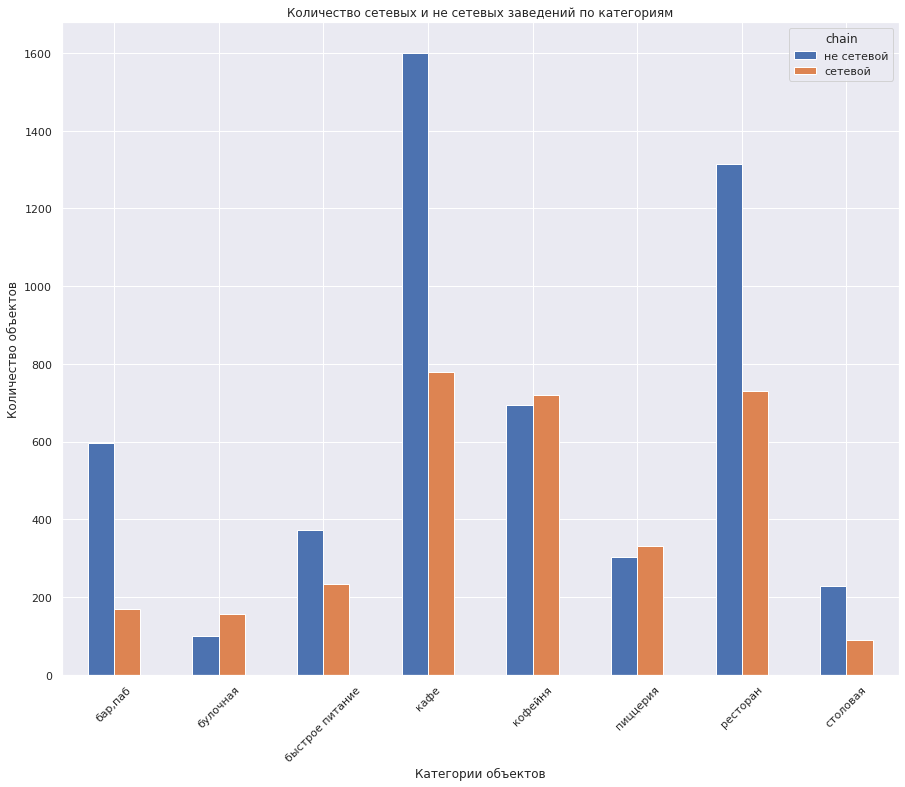

In [17]:
ax = temp.plot(kind='bar')
ax.set_xlabel('Категории объектов')
ax.set_ylabel('Количество объектов')
ax.set_title('Количество сетевых и не сетевых заведений по категориям')
plt.xticks(rotation=45)
plt.show()

Исходя из получившихся расчётов не сетевых заведений больше.

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [18]:
table = df.groupby('name')['name'].count().sort_values(ascending=False)
table_1 = table.head(15)
table_1

name
Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
Name: name, dtype: int64

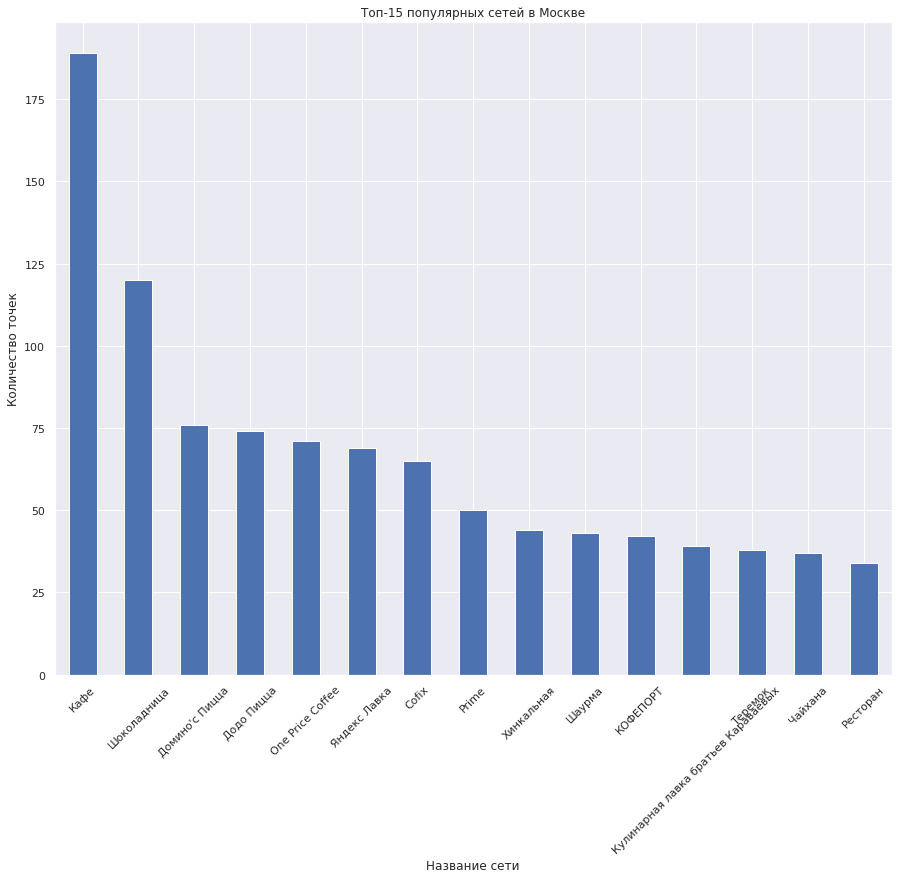

In [19]:
ax = table_1.plot(kind='bar')
ax.set_xlabel('Название сети')
ax.set_ylabel('Количество точек')
ax.set_title('Топ-15 популярных сетей в Москве')
plt.xticks(rotation=45)
plt.show()

Многие заведения знакомы. Объединяет их в основном то, что это крупные сети, имеющие репутацию и клиентскую базу.
Отнести их можно к категории быстрого питания.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [20]:
table = df.groupby('district')['district'].count().sort_values(ascending=False)
col_zaved = df['district'].count()


print(table)
print('Всего административных районов:', table.count())
print('Всего заведений:', col_zaved)

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64
Всего административных районов: 9
Всего заведений: 8406


In [21]:
table_svod = df.pivot_table(index = 'district', columns = 'category', values = 'name', aggfunc='count')
table_svod['total'] = table_svod['бар,паб']+table_svod['булочная']+table_svod['быстрое питание']\
                                +table_svod['кофейня']+table_svod['пиццерия']+\
                                                table_svod['ресторан']+table_svod['столовая']+table_svod['кафе']
table_svod

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


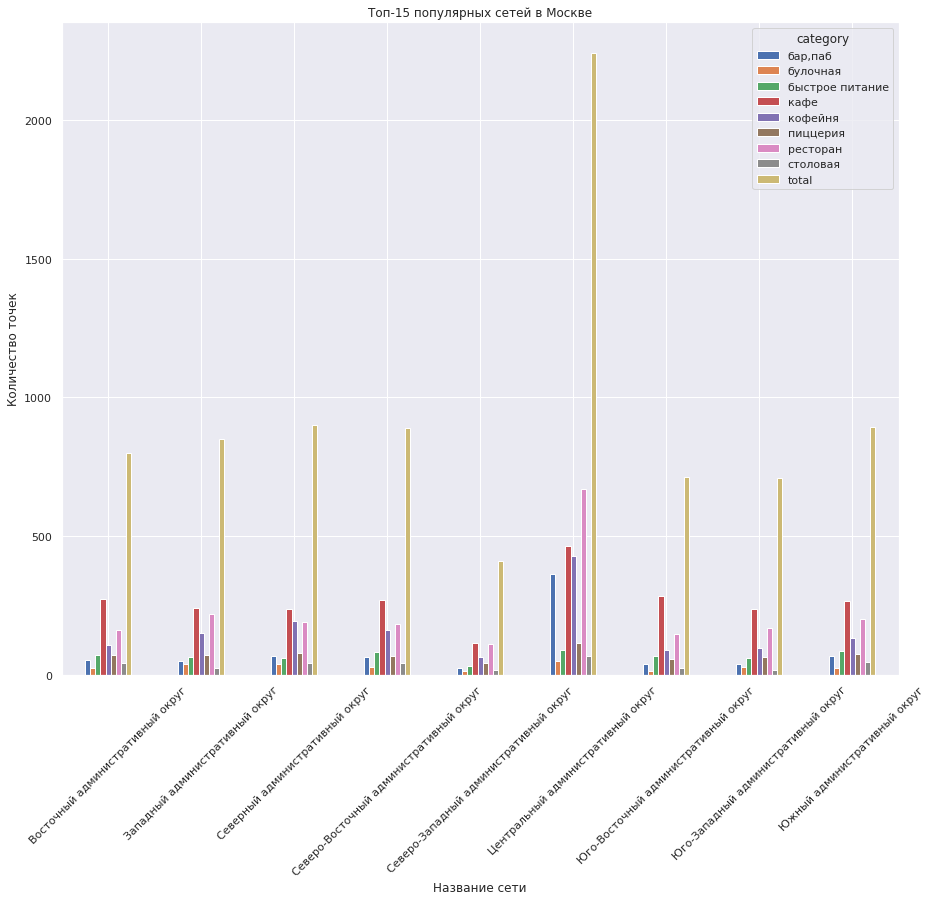

In [22]:
ax = table_svod.plot(kind='bar')
ax.set_xlabel('Название сети')
ax.set_ylabel('Количество точек')
ax.set_title('Топ-15 популярных сетей в Москве')
plt.xticks(rotation=45)
plt.show()

рестораны лидируют в Северо-Западном административном округе. В то время как наибольшее количество заведенйи сосредоточено в центральнмо районе - Центральный административный округ.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [23]:
table_2 = df.groupby('category')['rating'].mean().sort_values(ascending=False)
table_2

category
бар,паб            4.387712
пиццерия           4.301264
ресторан           4.290357
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.123886
быстрое питание    4.050249
Name: rating, dtype: float64

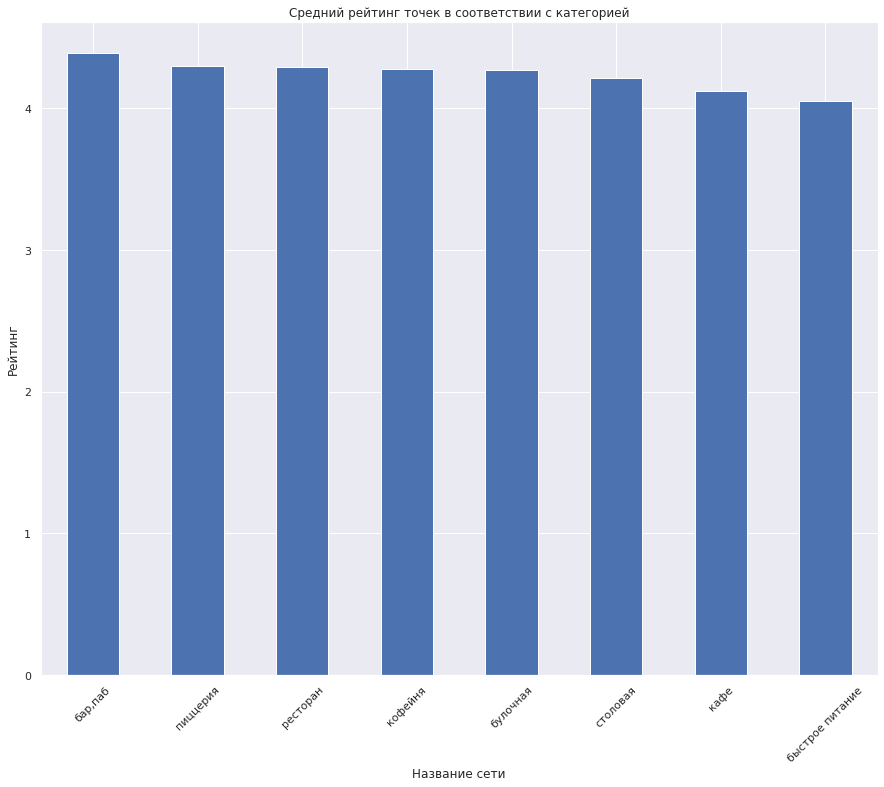

In [24]:
ax = table_2.plot(kind='bar')
ax.set_xlabel('Название сети')
ax.set_ylabel('Рейтинг')
ax.set_title('Средний рейтинг точек в соответствии с категорией')
plt.xticks(rotation=45)
plt.show()


Рейтинг различается не сильно у разных типов заведений. В целом он не опускается ниже 4х.

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).**

In [25]:
table_3 = df.groupby('district')['rating'].mean().sort_values(ascending=False)
table_3 

district
Центральный административный округ         4.377520
Северный административный округ            4.239778
Северо-Западный административный округ     4.208802
Южный административный округ               4.184417
Западный административный округ            4.181551
Восточный административный округ           4.174185
Юго-Западный административный округ        4.172920
Северо-Восточный административный округ    4.148260
Юго-Восточный административный округ       4.101120
Name: rating, dtype: float64

In [26]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map (location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= table_3,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity= 0.5,
    legend_name='Рейтинг заведений по районам',
 ).add_to(m)

# выводим карту
m

 Наивысший рейтинг наблюдается в центральнмо районе

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [27]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Больше всгео заведений также в центральном районе.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [28]:
top_15 = df.groupby('street')['name'].count().sort_values(ascending=False).head(15)

top_15

street
 проспект Мира             184
 Профсоюзная улица         122
 проспект Вернадского      108
 Ленинский проспект        107
 Ленинградский проспект     95
 Дмитровское шоссе          88
 Каширское шоссе            77
 Варшавское шоссе           76
 Ленинградское шоссе        70
 МКАД                       65
 Люблинская улица           60
 улица Вавилова             55
 Кутузовский проспект       54
 улица Миклухо-Маклая       49
 Пятницкая улица            48
Name: name, dtype: int64

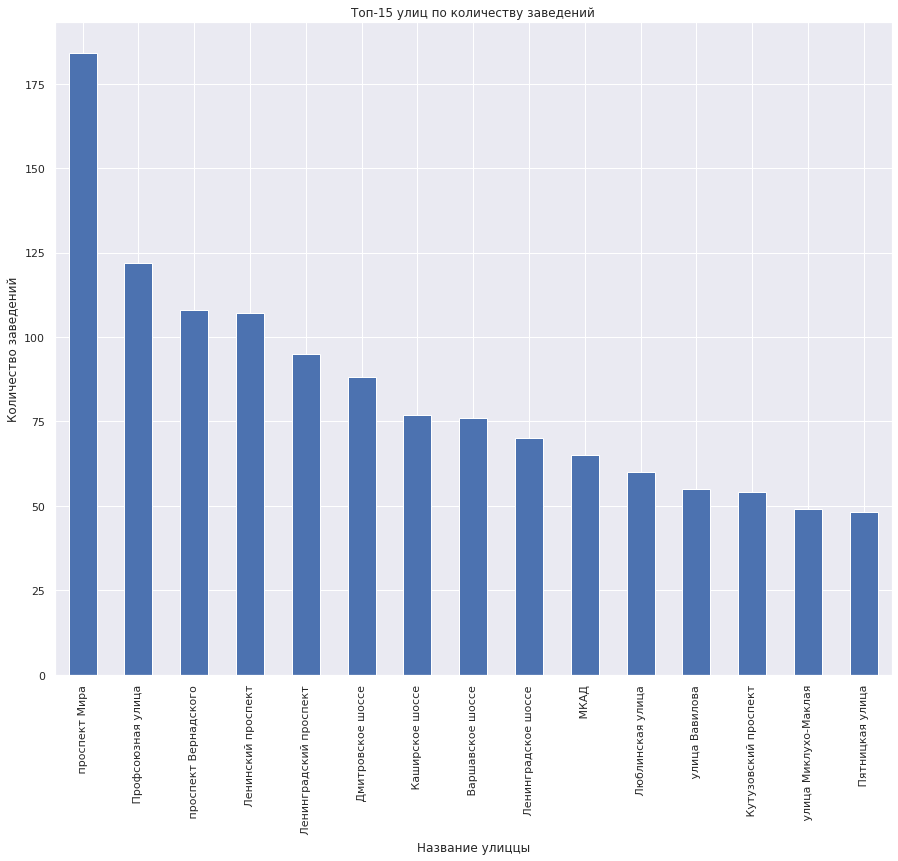

In [29]:
ax = top_15.plot(kind='bar')
ax.set_xlabel('Название улиццы')
ax.set_ylabel('Количество заведений')
ax.set_title('Топ-15 улиц по количеству заведений')
plt.xticks(rotation=90)
plt.show()

In [45]:
top_15_1 = df.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc='count')
top_15_1['total'] = top_15_1['бар,паб']+top_15_1['булочная']+top_15_1['быстрое питание']+\
                                                                    top_15_1['кафе']+top_15_1['кофейня']+top_15_1['пиццерия']\
                                                                        +top_15_1['ресторан']+top_15_1['столовая']
top_15_1 = top_15_1.sort_values(by = ['total'] , ascending=False).head(15)
top_15_1

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0,54.0
Алтуфьевское шоссе,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0,47.0


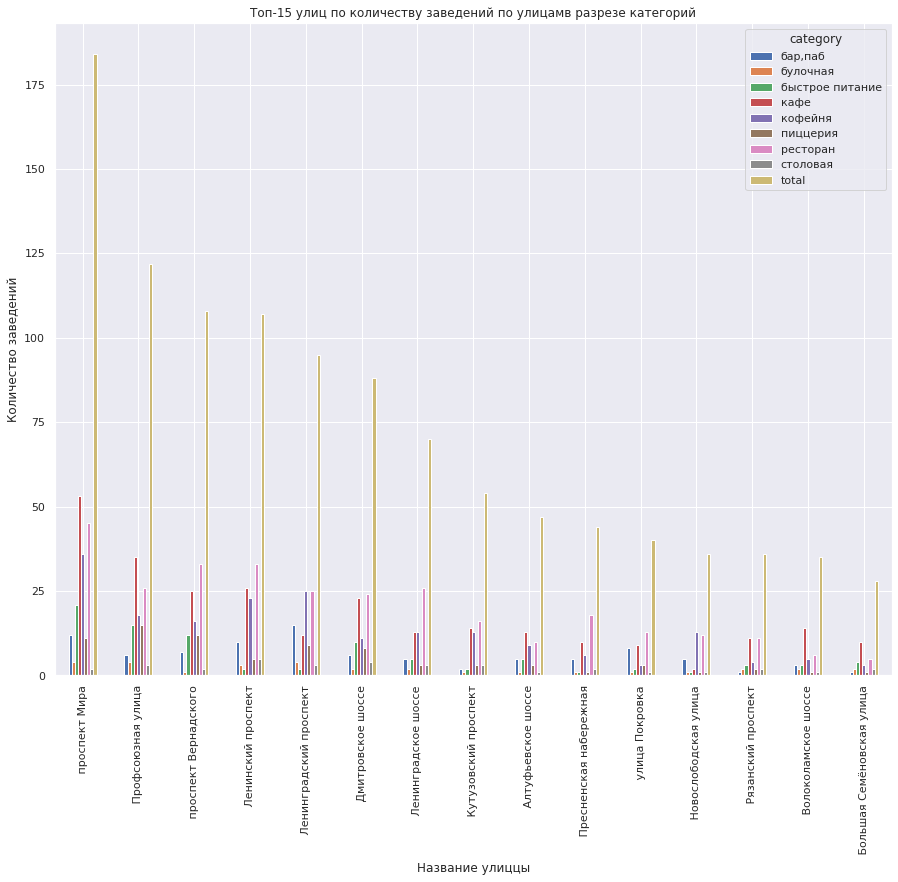

In [48]:
ax = top_15_1.plot(kind='bar')
ax.set_xlabel('Название улиццы')
ax.set_ylabel('Количество заведений')
ax.set_title('Топ-15 улиц по количеству заведений по улицамв разрезе категорий')
plt.xticks(rotation=90)
plt.show()

Если строить Топ-15 улиц по количеству заведенйи, то больше всего заведений на проспекте Мира - 184. А меньше всего на Пятницкая улица - там всего 48 заведений.

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [32]:
#находим улицу только с 1 заведением
ulits_s_1 = df.groupby('street')['name'].count().sort_values()
ulits_1 = ulits_s_1 == 1
print(ulits_1)
print('Всего улиц с одним заведнием:', ulits_1.count())

street
 1-й Автозаводский проезд     True
 Одинцовская улица            True
 Октябрьский переулок         True
 Ордынский тупик              True
 Оренбургская улица           True
                             ...  
 Ленинградский проспект      False
 Ленинский проспект          False
 проспект Вернадского        False
 Профсоюзная улица           False
 проспект Мира               False
Name: name, Length: 1448, dtype: bool
Всего улиц с одним заведнием: 1448


Если посомтреть на карте, все эти заведеняи нахождятся на окраине в Москвы, в новых районах, потмоу на этих улицах и по одному заведению. 

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [33]:
median = df.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by = 'middle_avg_bill', ascending=False)
median

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [34]:

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map (location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity= 0.8,
    legend_name='Медиана среднего чека по районам',
 ).add_to(m)

# выводим карту
m

Удалённость от центра влияет напрямую. там самые высокие средние чеки. Ещё Высокие в Западный административный округе. Если посмотреть на карту, то в него попадает аэропорт, скорее всего именно цены внём влияют на цены.

**Соберите наблюдения по вопросам выше в один общий вывод.**

Теперь можем проанализировать полученные результаты по объектам общественного питания Москвы:

Самые популярные форматы: кафе и ресторан.
Преобладают в основном несетевые заведения.

Большим количеством посадочных мест обладают столовые, рестораны и бары.
По сетевому формату в основном открывают заведения категории "кафе".
Есть улицы с большим колчеством объектов общественного питания, где нет посадочных мест.
Наибольшее количество объектов питания расположены на главных артериях города: Ленинградском проспекте, Просоюзной улице и проспекте Мира.

Рекомендации: я бы рекомендовал обратить внимание на центральную часть города(постоянный случайный поток посетителей), в частности те улицы, где минимальное количество объектов общественного питания. Формат для заведения следует выбрать "кафе" с количеством посадочных мест 30-50.

<a name="stage_4"></a>
# Шаг 4. Детализируем исследование: открытие кофейни

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [35]:
# остротируем все кофейни
filter = df['category'].isin(['кофейня'])
filtered_dataset = df[filter]
filtered_dataset

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,не сетевой,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевой,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевой,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевой,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевой,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,не сетевой,NaN,Люблинская улица,False
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,не сетевой,206.0,Волгоградский проспект,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,не сетевой,NaN,Грайвороновская улица,False
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,не сетевой,NaN,Новохохловская улица,False


In [36]:
#посчитаем количество кофеен
print('Всего кофеен:', filtered_dataset['category'].count())

Всего кофеен: 1413


In [37]:
#теперь посмотрим в каких районах сколько кофеен
raion = filtered_dataset.groupby('district')['category'].count()
raion

district
Восточный административный округ           105
Западный административный округ            150
Северный административный округ            193
Северо-Восточный административный округ    159
Северо-Западный административный округ      62
Центральный административный округ         428
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Южный административный округ               131
Name: category, dtype: int64

- Есть ли круглосуточные кофейни?

In [38]:
from pandas.core.groupby import groupby
filtered_dataset_1 = filtered_dataset[filtered_dataset['is_24/7'] == True]
filtered_dataset_1.groupby('is_24/7')['is_24/7'].count()

is_24/7
True    59
Name: is_24/7, dtype: int64

Есть 59 круглосуточных кофеен

- Какие у кофеен рейтинги? Как они распределяются по районам?

In [39]:
#рейтенги кофеен
filtered_dataset.groupby('name')['rating'].median().sort_values(ascending=False)

name
Лофт Кофе Деталька    5.0
The Coffee Club       5.0
Кофейная история      5.0
Booblik               5.0
За Думой              5.0
                     ... 
Coffprice             3.0
Gold                  3.0
Шкафе Бульон          2.9
Monty Cafe            2.3
Маракуйя              1.4
Name: rating, Length: 839, dtype: float64

In [40]:
#распределение по районам
filtr = filtered_dataset.groupby('district')['rating'].median().sort_values(ascending=False)
filtr

district
Восточный административный округ           4.3
Северный административный округ            4.3
Северо-Восточный административный округ    4.3
Северо-Западный административный округ     4.3
Центральный административный округ         4.3
Юго-Восточный административный округ       4.3
Юго-Западный административный округ        4.3
Южный административный округ               4.3
Западный административный округ            4.2
Name: rating, dtype: float64

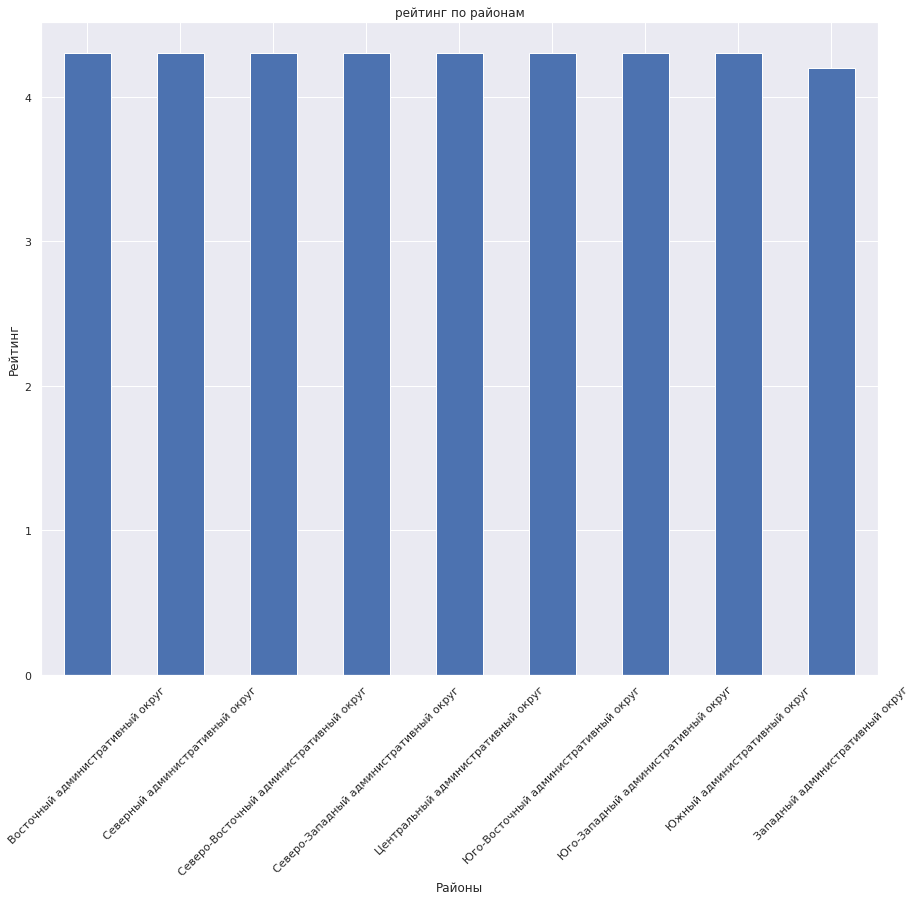

In [41]:
#визуализируем рейтинг
ax = filtr.plot(kind='bar')
ax.set_xlabel('Районы')
ax.set_ylabel('Рейтинг')
ax.set_title('рейтинг по районам')
plt.xticks(rotation=45)
plt.show()

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [42]:
fil = filtered_dataset.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
fil

,district,middle_avg_bill
0,Западный административный округ,600.0
1,Центральный административный округ,500.0
2,Восточный административный округ,400.0
3,Южный административный округ,387.5
4,Юго-Западный административный округ,375.0
5,Северный административный округ,325.0
6,Северо-Восточный административный округ,325.0
7,Северо-Западный административный округ,325.0
8,Юго-Восточный административный округ,250.0


In [43]:
#визуализируем на карту полученные результаты

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map (location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= fil,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity= 0.8,
    legend_name='Медиана среднего чека по районам',
 ).add_to(m)

# выводим карту
m

In [44]:
fil['middle_avg_bill'].mean()

387.5

Стоит ориентироваться на 387.50 руб за чашку кофе. Эта цена является средней по всем районам и является подходящей для определеняи цены т.к. такая цена привлечёт клиентов.

**Вывды и рекомендации:**
На оснвоании проведённого исследования получается, что:
- Средний рейтинг по районам одинаков и в районе 4.3, только в "Западный административный округ" рейтинг ниже - 4.2
- Средняя цена чашки должна быть в районе 387.50 руб.
- Круглосутчоных кофеен не много, всего 59 из 1413.


Таким образом можно открыть кофейню в любом районе города со средней стоимостью чашки кофе в 350 р. Она не обязательно должна быть круглосутчоной. Наиболее лучшими районами для открытия кофейни видятся:
 - Западный административный округ;           
 - Центральный административный округ;        
 - Восточный административный округ;         
 - Южный административный округ; 

<a name="stage_5"></a>
# Шаг 5. Подготовка презентации

Презентация: https://drive.google.com/file/d/1W2uvkyi7rLzZIxpMAy-yDvC_L1bgx9z3/view?usp=sharing